# **Download Detectron2**

(must restart runtime)

In [2]:
!pip install pyyaml==5.1

import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)

!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html



     |████████████████████████████████| 274 kB 3.9 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=974198a8d6590a1123d88c11baca9adad742c93ab136f2a32816cffedbea4f97
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
torch:  1.10 ; cuda:  cu111
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu111/torch1.10/index.html
     |████████████████████████████████| 7.0 MB 881 kB/s 
     |████████████████████████████████| 145 kB 5.4 MB/s 
     |████████████████████████████████| 130 kB 44.5 MB/s 
     |████████████████████████████████| 50 kB 4.8 MB/s 
     |████████████████████████████████| 77 kB 4.0 MB/s 
     |████████████████████████████████| 749 kB 42.0 MB/s 
     |████████████████████████████████

In [1]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()


import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow


from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# **Load COCO Dataset**

Eventually moved data to my Google Drive

In [2]:
#Download images zipped file
!wget http://images.cocodataset.org/zips/train2017.zip

--2022-04-12 17:33:19--  http://images.cocodataset.org/zips/train2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 52.217.37.220
Connecting to images.cocodataset.org (images.cocodataset.org)|52.217.37.220|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 19336861798 (18G) [application/zip]
Saving to: ‘train2017.zip’

train2017.zip       100%[===================>]  18.01G  96.6MB/s    in 3m 32s  

2022-04-12 17:36:51 (86.8 MB/s) - ‘train2017.zip’ saved [19336861798/19336861798]



In [3]:
#access google Drive files
from google.colab import drive
drive.mount('/content/gdrive')

#unzip the zipped images file
! unzip train2017.zip

Streaming output truncated to the last 5000 lines.
 extracting: train2017/000000259556.jpg  
 extracting: train2017/000000381931.jpg  
 extracting: train2017/000000569592.jpg  
 extracting: train2017/000000229396.jpg  
 extracting: train2017/000000488990.jpg  
 extracting: train2017/000000348684.jpg  
 extracting: train2017/000000234031.jpg  
 extracting: train2017/000000563584.jpg  
 extracting: train2017/000000276069.jpg  
 extracting: train2017/000000401194.jpg  
 extracting: train2017/000000502089.jpg  
 extracting: train2017/000000192183.jpg  
 extracting: train2017/000000425127.jpg  
 extracting: train2017/000000126766.jpg  
 extracting: train2017/000000324161.jpg  
 extracting: train2017/000000452746.jpg  
 extracting: train2017/000000423782.jpg  
 extracting: train2017/000000546343.jpg  
 extracting: train2017/000000249290.jpg  
 extracting: train2017/000000025529.jpg  
 extracting: train2017/000000316928.jpg  
 extracting: train2017/000000337866.jpg  
 extracting: train2017/00

In [4]:
! wget http://images.cocodataset.org/annotations/annotations_trainval2017.zip


! unzip annotations_trainval2017.zip

--2022-04-12 17:41:01--  http://images.cocodataset.org/annotations/annotations_trainval2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 52.216.77.52
Connecting to images.cocodataset.org (images.cocodataset.org)|52.216.77.52|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 252907541 (241M) [application/zip]
Saving to: ‘annotations_trainval2017.zip’

annotations_trainva 100%[===================>] 241.19M  79.9MB/s    in 3.0s    

2022-04-12 17:41:04 (79.9 MB/s) - ‘annotations_trainval2017.zip’ saved [252907541/252907541]

Archive:  annotations_trainval2017.zip
  inflating: annotations/instances_train2017.json  
  inflating: annotations/instances_val2017.json  
  inflating: annotations/captions_train2017.json  
  inflating: annotations/captions_val2017.json  
  inflating: annotations/person_keypoints_train2017.json  
  inflating: annotations/person_keypoints_val2017.json  


In [11]:
!wget http://images.cocodataset.org/zips/val2017.zip

--2022-04-12 17:45:09--  http://images.cocodataset.org/zips/val2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 52.217.235.217
Connecting to images.cocodataset.org (images.cocodataset.org)|52.217.235.217|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 815585330 (778M) [application/zip]
Saving to: ‘val2017.zip’

val2017.zip         100%[===================>] 777.80M  95.3MB/s    in 8.3s    

2022-04-12 17:45:18 (93.7 MB/s) - ‘val2017.zip’ saved [815585330/815585330]



In [12]:
! unzip val2017.zip

Streaming output truncated to the last 5000 lines.
 extracting: val2017/000000212226.jpg  
 extracting: val2017/000000231527.jpg  
 extracting: val2017/000000578922.jpg  
 extracting: val2017/000000062808.jpg  
 extracting: val2017/000000119038.jpg  
 extracting: val2017/000000114871.jpg  
 extracting: val2017/000000463918.jpg  
 extracting: val2017/000000365745.jpg  
 extracting: val2017/000000320425.jpg  
 extracting: val2017/000000481404.jpg  
 extracting: val2017/000000314294.jpg  
 extracting: val2017/000000335328.jpg  
 extracting: val2017/000000513688.jpg  
 extracting: val2017/000000158548.jpg  
 extracting: val2017/000000132116.jpg  
 extracting: val2017/000000415238.jpg  
 extracting: val2017/000000321333.jpg  
 extracting: val2017/000000081738.jpg  
 extracting: val2017/000000577584.jpg  
 extracting: val2017/000000346905.jpg  
 extracting: val2017/000000433980.jpg  
 extracting: val2017/000000228144.jpg  
 extracting: val2017/000000041872.jpg  
 extracting: val2017/00000011

#Convert annotations json file to dataframe

In [5]:
import logging
logging.getLogger().setLevel(logging.CRITICAL)
!pip install pylabel > /dev/null
from pylabel import importer
#Specify path to the coco.json file
path_to_annotations = 'annotations/instances_train2017.json'
#Specify the path to the images (if they are in a different folder than the annotations)
path_to_images = "train2017"

#Import the dataset into the pylable schema 
dataset = importer.ImportCoco(path_to_annotations, path_to_images=path_to_images, name="train_coco")
dataset.df = dataset.df[dataset.df.cat_name.isin(['person', 'backpack', 'handbag', 'tie', 'suitcase', 'cell phone', 'laptop', 'tv'])]




#View column names to identify columns containing class labels and bounding box coordinates
print(dataset.df.columns)



Index(['img_folder', 'img_filename', 'img_path', 'img_id', 'img_width',
       'img_height', 'img_depth', 'ann_segmented', 'ann_bbox_xmin',
       'ann_bbox_ymin', 'ann_bbox_xmax', 'ann_bbox_ymax', 'ann_bbox_width',
       'ann_bbox_height', 'ann_area', 'ann_segmentation', 'ann_iscrowd',
       'ann_pose', 'ann_truncated', 'ann_difficult', 'cat_id', 'cat_name',
       'cat_supercategory', 'split', 'annotated'],
      dtype='object')


In [6]:
import pandas as pd
df = pd.DataFrame(dataset.df)
df.head()
df = df.sample(n=500)

compression_opts = dict(method='zip',archive_name='train.csv')
df.to_csv('train.zip', index=False,compression=compression_opts) 

In [7]:
! unzip train.zip

Archive:  train.zip
  inflating: train.csv               


In [13]:
import logging
logging.getLogger().setLevel(logging.CRITICAL)
!pip install pylabel > /dev/null
from pylabel import importer
#Specify path to the coco.json file
path_to_annotations = 'annotations/instances_val2017.json'
#Specify the path to the images (if they are in a different folder than the annotations)
path_to_images = "val2017"

#Import the dataset into the pylable schema 
valdataset = importer.ImportCoco(path_to_annotations, path_to_images=path_to_images, name="val_coco")
valdataset.df = valdataset.df[valdataset.df.cat_name.isin(['person', 'backpack', 'handbag', 'tie', 'suitcase', 'cell phone', 'laptop', 'tv'])]




#View column names to identify columns containing class labels and bounding box coordinates
print(valdataset.df.columns)



Index(['img_folder', 'img_filename', 'img_path', 'img_id', 'img_width',
       'img_height', 'img_depth', 'ann_segmented', 'ann_bbox_xmin',
       'ann_bbox_ymin', 'ann_bbox_xmax', 'ann_bbox_ymax', 'ann_bbox_width',
       'ann_bbox_height', 'ann_area', 'ann_segmentation', 'ann_iscrowd',
       'ann_pose', 'ann_truncated', 'ann_difficult', 'cat_id', 'cat_name',
       'cat_supercategory', 'split', 'annotated'],
      dtype='object')


In [14]:
import pandas as pd
df = pd.DataFrame(valdataset.df)
df.head()
df = df.sample(n=60)

compression_opts = dict(method='zip',archive_name='val.csv')
df.to_csv('val.zip', index=False,compression=compression_opts) 

In [15]:
! unzip val.zip

Archive:  val.zip
  inflating: val.csv                 


In [9]:
#Delete files in train folder that don't match subsetted dataset
import os
import pandas as pd

path = "train2017/"

flist = pd.read_csv('train.csv')

file_name = flist['img_filename'].tolist()

for filename in os.listdir(path):
  
    #If file is not present in list
    if filename not in file_name:
        #Get full path of file and remove it
        full_file_path = os.path.join(path, filename)
        os.remove(full_file_path)

In [16]:
#Delete files in train folder that don't match subsetted dataset
import os
import pandas as pd

path = "val2017/"

flist = pd.read_csv('val.csv')

file_name = flist['img_filename'].tolist()

for filename in os.listdir(path):
  
    #If file is not present in list
    if filename not in file_name:
        #Get full path of file and remove it
        full_file_path = os.path.join(path, filename)
        os.remove(full_file_path)

#Load Data from Google Drive

In [12]:
#access google Drive files
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [3]:
#Load dataset into detectron2 format
from detectron2.structures import BoxMode

def get_coco_dicts(csv_file, img_dir):
    df = pd.read_csv(csv_file)
    df['img_filename'] = df['img_filename'].map(lambda x: img_dir+x)

    classes = ['person', 'backpack', 'handbag', 'tie', 'suitcase', 'cell phone', 'laptop', 'tv']

#COCO categories: person bicycle car motorcycle airplane bus train truck boat traffic light fire hydrant stop sign parking meter bench bird cat dog horse sheep cow elephant bear zebra giraffe backpack umbrella handbag tie suitcase frisbee skis snowboard sports ball kite baseball bat baseball glove skateboard surfboard tennis racket bottle wine glass cup fork knife spoon bowl banana apple sandwich orange broccoli carrot hot dog pizza donut cake chair couch potted plant bed dining table toilet tv laptop mouse remote keyboard cell phone microwave oven toaster sink refrigerator book clock vase scissors teddy bear hair drier toothbrush
    df['class_int'] = df['cat_name'].map(lambda x: classes.index(x))

    dataset_dicts = []
    for img_filename in df['img_filename'].unique().tolist():
        record = {}
        
        height, width = cv2.imread(img_filename).shape[:2]
        
        record["file_name"] = img_filename
        record["height"] = height
        record["width"] = width

        objs = []
        for index, row in df[(df['img_filename']==img_filename)].iterrows():
          obj= {
              'bbox': [row['ann_bbox_xmin'], row['ann_bbox_ymin'], row['ann_bbox_xmax'], row['ann_bbox_ymax']],
              'bbox_mode': BoxMode.XYXY_ABS,
              'category_id': row['class_int'],
              "iscrowd": 0
          }
          objs.append(obj)
        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

In [4]:
from detectron2.data import DatasetCatalog, MetadataCatalog

classes = ['person', 'backpack', 'handbag', 'tie', 'suitcase', 'cell phone', 'laptop', 'tv']

for d in ["train", "val"]:
    DatasetCatalog.register(d + 'g', lambda d=d: get_coco_dicts('gdrive/My Drive/'+ d + '.csv', 'gdrive/My Drive/'+ d + '2017/'))
    MetadataCatalog.get(d).set(thing_classes=classes)
coco_metadata = MetadataCatalog.get('traing')

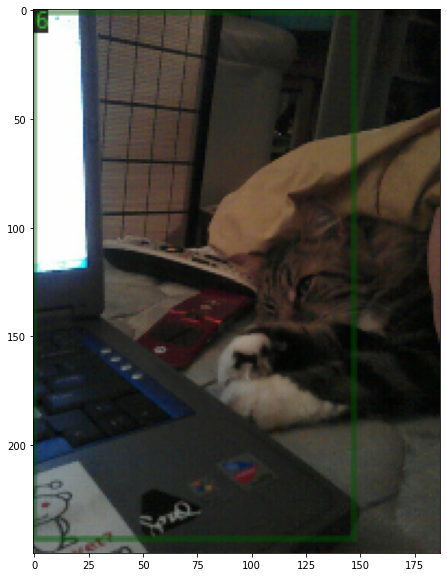

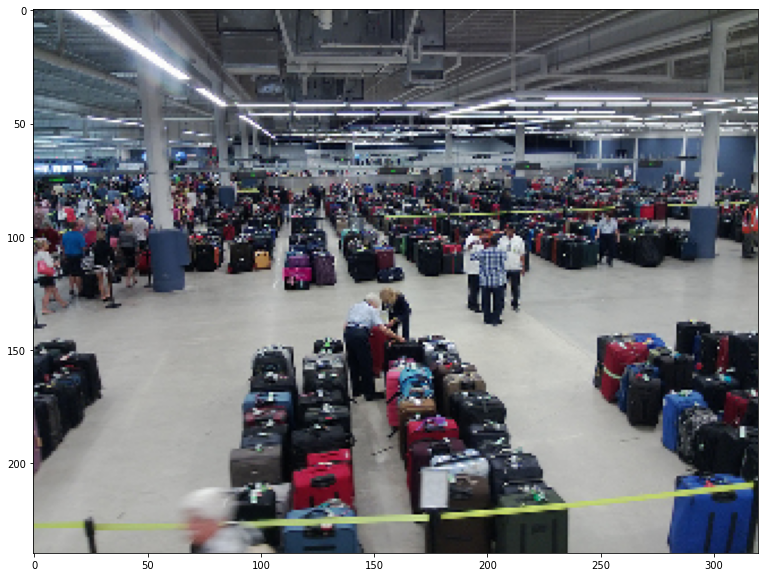

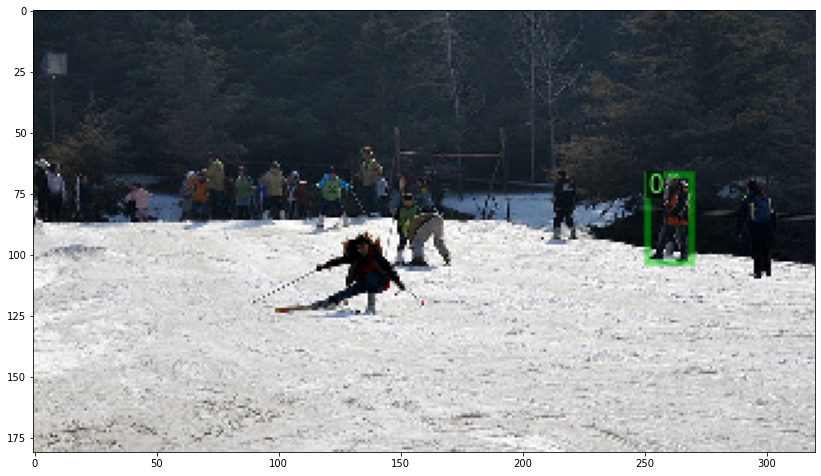

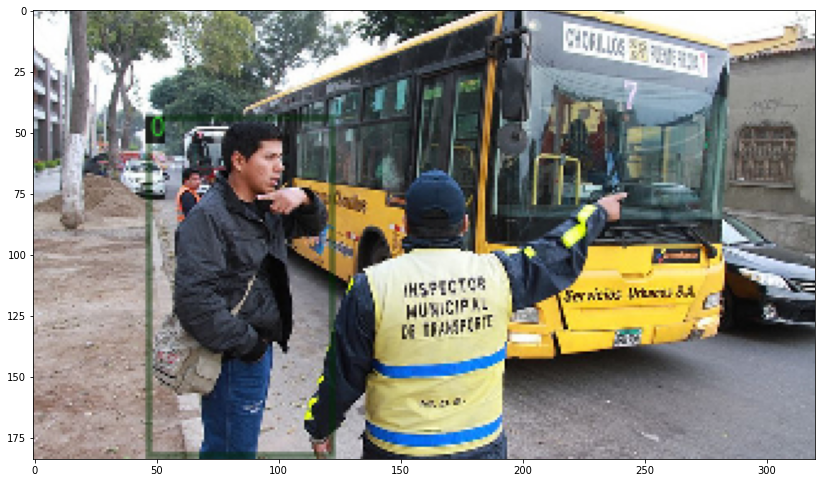

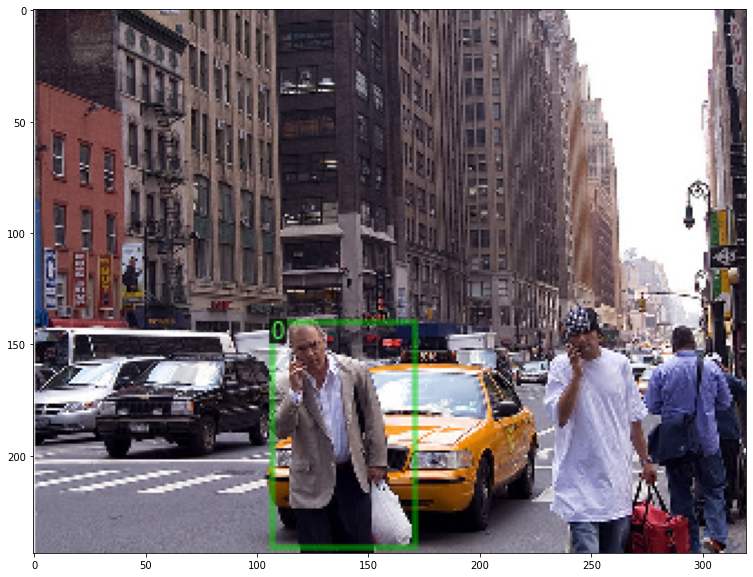

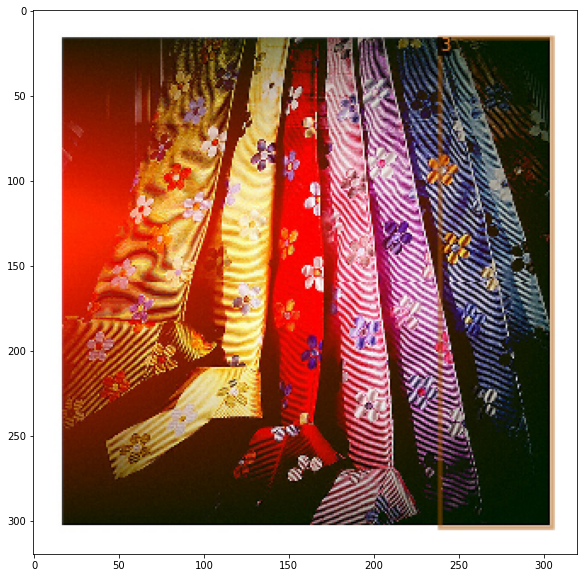

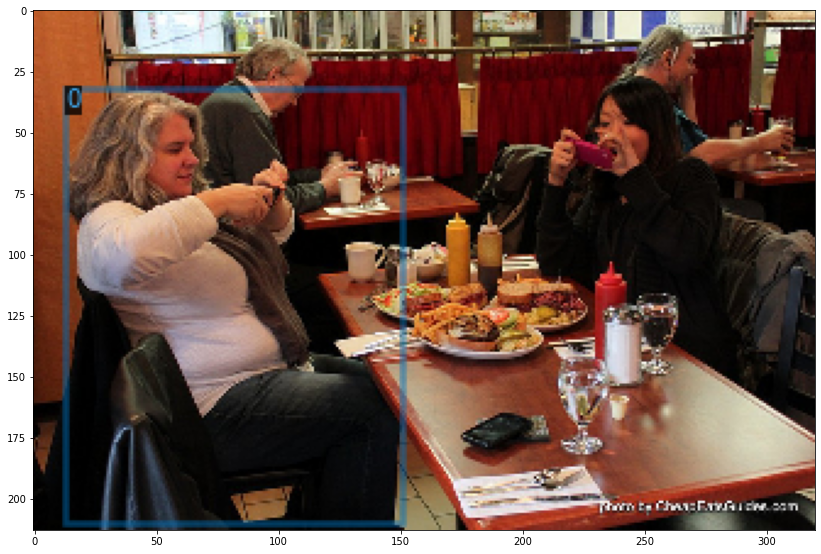

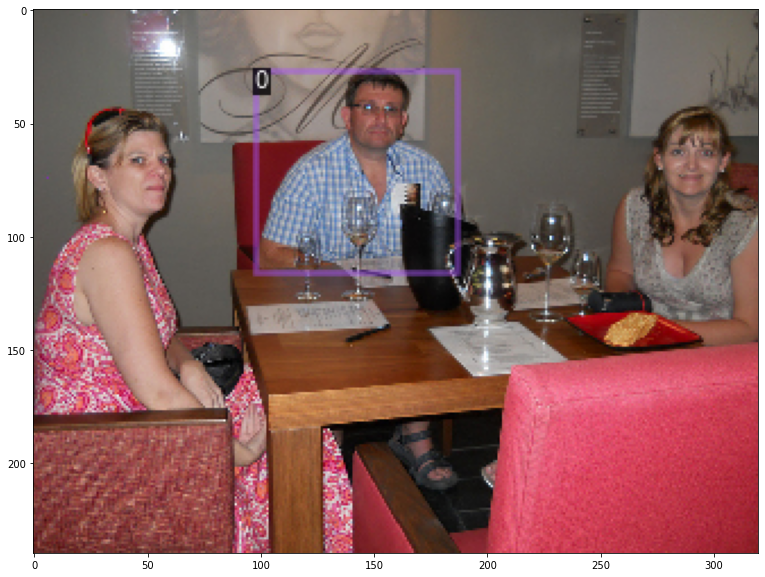

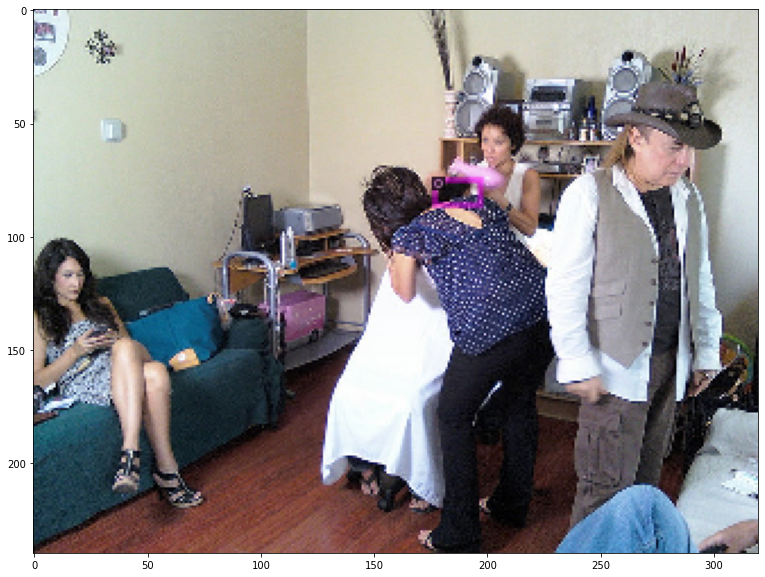

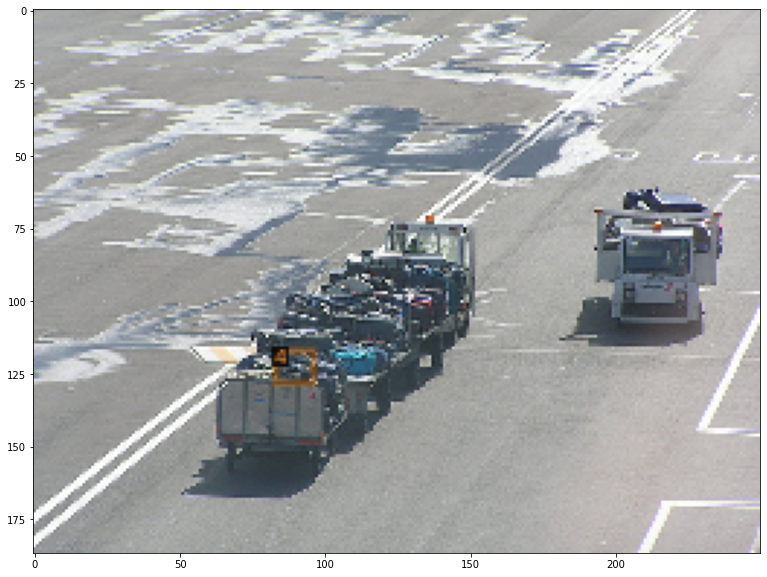

In [5]:
#dataset_dicts = get_microcontroller_dicts('/content/Microcontroller Detection/train_labels.csv', '/content/Microcontroller Detection/train')
import pandas as pd
import matplotlib.pyplot as plt

dataset_dicts = DatasetCatalog.get('traing')

for d in random.sample(dataset_dicts, 10):
    img = cv2.imread(d["file_name"])
    v = Visualizer(img[:, :, ::-1], metadata=coco_metadata, scale=0.5)
    v = v.draw_dataset_dict(d)
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

In [14]:
from detectron2.engine import DefaultTrainer
import torch
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("traing",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml") 
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.MAX_ITER = 100    
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 8

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[04/12 18:56:40 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (9, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (9,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (32, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (32,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, 

[04/12 18:56:46 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


[04/12 18:57:14 d2.utils.events]:  eta: 0:01:49  iter: 19  total_loss: 0.5153  loss_cls: 0.4069  loss_box_reg: 0.1032  loss_rpn_cls: 0.02831  loss_rpn_loc: 0.0056  time: 1.3725  data_time: 0.0230  lr: 0.0038162  max_mem: 5828M
[04/12 18:57:41 d2.utils.events]:  eta: 0:01:23  iter: 39  total_loss: 0.2642  loss_cls: 0.1159  loss_box_reg: 0.06954  loss_rpn_cls: 0.02858  loss_rpn_loc: 0.006689  time: 1.3608  data_time: 0.0104  lr: 0.0078122  max_mem: 5828M
[04/12 18:58:07 d2.utils.events]:  eta: 0:00:54  iter: 59  total_loss: 0.1988  loss_cls: 0.07209  loss_box_reg: 0.0366  loss_rpn_cls: 0.04395  loss_rpn_loc: 0.01367  time: 1.3357  data_time: 0.0131  lr: 0.011808  max_mem: 5828M
[04/12 18:58:35 d2.utils.events]:  eta: 0:00:26  iter: 79  total_loss: 0.1839  loss_cls: 0.06129  loss_box_reg: 0.04602  loss_rpn_cls: 0.05976  loss_rpn_loc: 0.008995  time: 1.3515  data_time: 0.0090  lr: 0.015804  max_mem: 5918M
[04/12 18:59:05 d2.utils.events]:  eta: 0:00:00  iter: 99  total_loss: 0.1576  loss_c

In [25]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
cfg.DATASETS.TEST = ('val2017', )
predictor = DefaultPredictor(cfg)

Save model

In [26]:
from detectron2.checkpoint import DetectionCheckpointer, Checkpointer


checkpointer = DetectionCheckpointer(trainer, save_dir=cfg.OUTPUT_DIR)
checkpointer.save("coco_1") 

Display test data results

/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


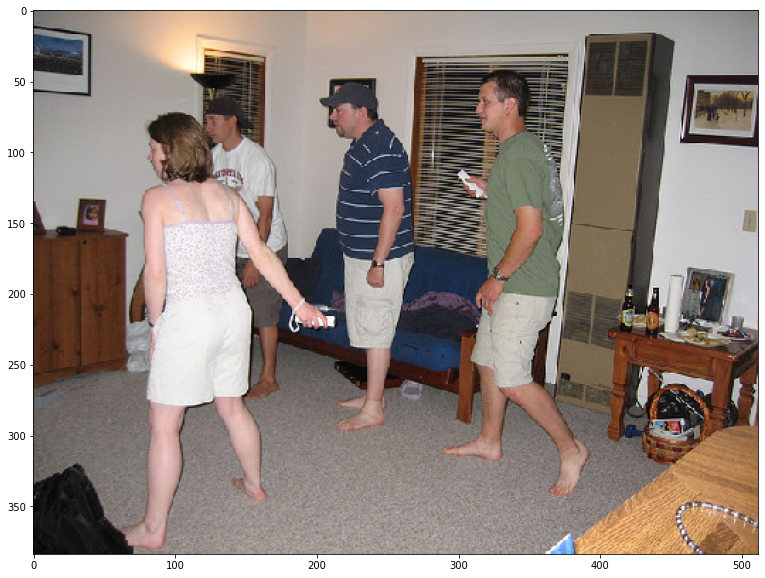

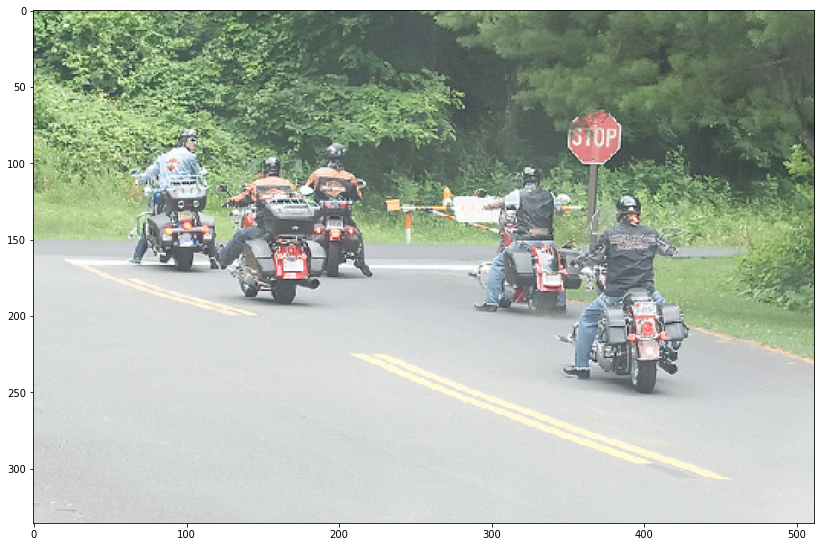

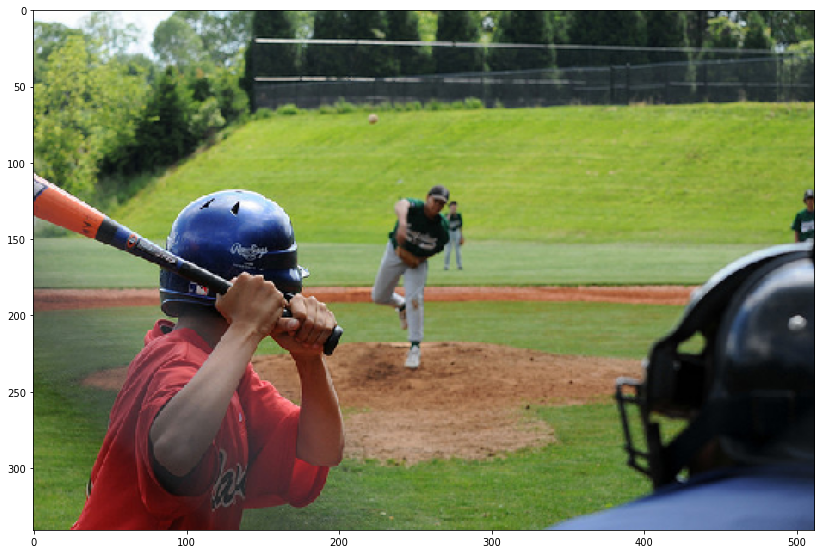

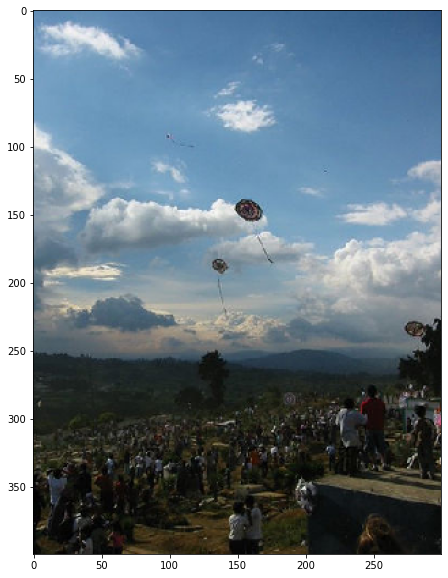

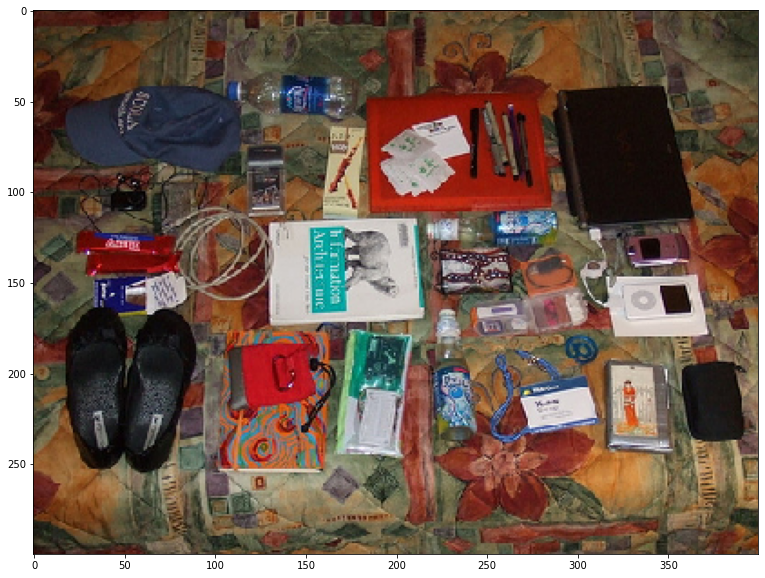

In [28]:
from detectron2.utils.visualizer import ColorMode
import random

dataset_dicts = DatasetCatalog.get('valg')
for d in random.sample(dataset_dicts, 5):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1], metadata=coco_metadata, scale=0.8)
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

Access webcam using JavaScript

In [18]:
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)
  data = eval_js('takePhoto({})'.format(quality))
  binary = b64decode(data.split(',')[1])
  with open(filename, 'wb') as f:
    f.write(binary)
  return filename

Capture Image

<IPython.core.display.Javascript object>

Saved to photo.jpg


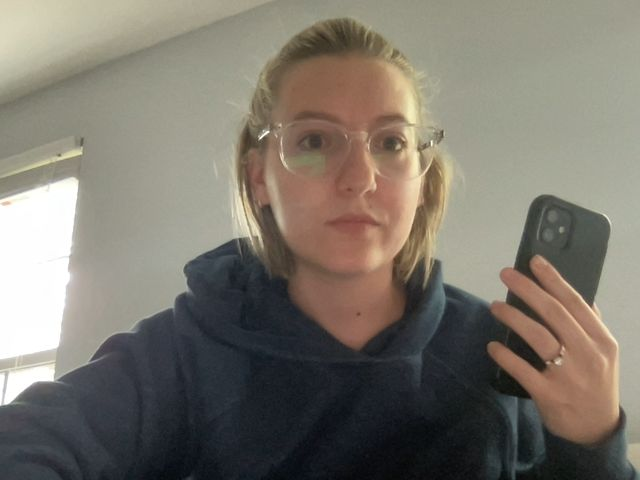

In [19]:
from IPython.display import Image
try:
  filename = take_photo()
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  print(str(err))

Apply model to photo

/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


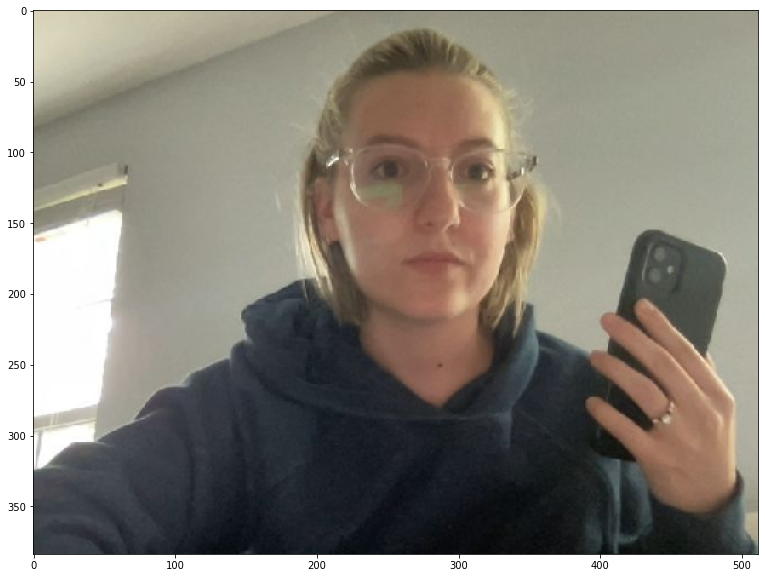

In [20]:
from detectron2.utils.visualizer import ColorMode
import random
    
im = cv2.imread("photo.jpg")
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], metadata=coco_metadata, scale=0.8)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
plt.figure(figsize = (14, 10))
plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
plt.show()